In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [4]:
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d balraj98/massachusetts-roads-dataset

massachusetts-roads-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [6]:
!unzip /content/massachusetts-roads-dataset.zip

Archive:  /content/massachusetts-roads-dataset.zip
replace label_class_dict.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
!pip install segmentation-models-pytorch

In [ ]:
!pip install torchmetrics
!pip install pytorch_lightning

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import albumentations as A
from albumentations.pytorch import ToTensorV2

from PIL import Image
from pathlib import Path

import torchvision.transforms.functional as TF
import time
import os
import copy

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data.sampler import SubsetRandomSampler
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR

from torchmetrics.classification import BinaryJaccardIndex
from torchmetrics import Dice
import segmentation_models_pytorch as smp
import pytorch_lightning as pl

In [2]:
train_images_path = Path('/content/tiff/train')
train_labels_path = Path('/content/tiff/train_labels')
val_images_path = Path('/content/tiff/val')
val_labels_path = Path('/content/tiff/val_labels')
test_images_path = Path('/content/tiff/test')
test_labels_path = Path('/content/tiff/test_labels')

In [3]:
train_paths = {'images': train_images_path , 'masks': train_labels_path }
val_paths = {'images': val_images_path , 'masks': val_labels_path }
test_paths = {'images': test_images_path , 'masks': test_labels_path }

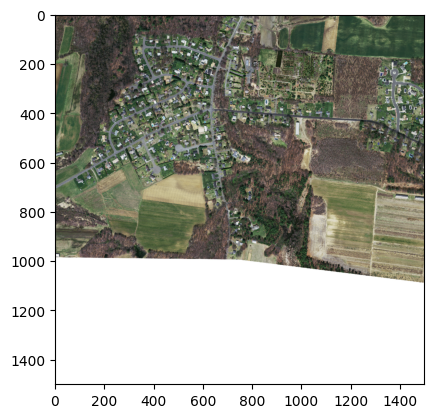

In [4]:
my_image_path = train_images_path / "10078660_15.tiff"
my_image = Image.open(my_image_path)
plt.imshow(my_image)

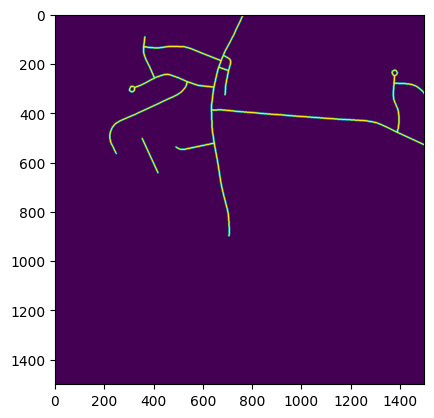

In [5]:
my_mask_path = train_labels_path / "10078660_15.tif"
my_mask = Image.open(my_mask_path)
plt.imshow(my_mask)

In [6]:
#hyperparameters
INPUT_SIZE = 1024
NUM_WORKERS = 2
BATCH_SIZE = 16

In [7]:
class RoadsDataset(Dataset):
    
    def __init__(self, data_dir, transform=None):
        self.image_dir = data_dir['images']
        self.mask_dir = data_dir['masks']
        self.transform = transform
        self.image_paths = self.image_dir.rglob("*.tif*")
        self.image_paths = sorted([path for path in self.image_paths])
        self.mask_paths = self.mask_dir.rglob("*.tif*")
        self.mask_paths = sorted([path for path in self.mask_paths])

        
    def __len__(self):
        return len(self.image_paths)

    
    def __getitem__(self, index):
        img_path = self.image_paths[index]
        mask_path = self.mask_paths[index]
        image = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32)
        mask[mask == 255.0] = 1.0

        if self.transform is not None:
            augmentations = self.transform(image=image, mask=mask)
            image = augmentations["image"]
            mask = augmentations["mask"]

        return image, mask

In [8]:
class RoadsDataModule(pl.LightningDataModule):
    
    def __init__(self, train_paths, val_paths, test_paths, batch_size, num_workers, input_size):
        super().__init__()
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.input_size = input_size
        self.train_transform = A.Compose(
            [
                A.RandomCrop(height=self.input_size, width=self.input_size, always_apply=True),
                A.RandomRotate90(p=0.5),
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.1),
                A.Normalize(
                    mean = [0.485, 0.456, 0.406],
                    std = [0.229, 0.224, 0.225],
                    max_pixel_value=255.0,
                ),
                ToTensorV2(),
            ],
        )

        self.val_transform = A.Compose(
            [
                A.Resize(height=self.input_size, width=self.input_size),
                A.Normalize(
                    mean = [0.485, 0.456, 0.406],
                    std = [0.229, 0.224, 0.225],
                    max_pixel_value=255.0,
                ),
                ToTensorV2(),
            ],
        )
        

    def setup(self, stage):
        
        self.train_ds = RoadsDataset(
            data_dir=train_paths,
            transform=self.train_transform,
        )
        
        self.val_ds = RoadsDataset(
            data_dir=val_paths,
            transform=self.val_transform,

        )
        
        self.test_ds = RoadsDataset(
            data_dir=test_paths,
            transform=self.val_transform,

        )

    def train_dataloader(self):
        return DataLoader(
            self.train_ds,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            pin_memory=True,
            shuffle=True,
        )

    def val_dataloader(self):
        return DataLoader(
            self.val_ds,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            pin_memory=True,
            shuffle=False,
        )

    def test_dataloader(self):
        return DataLoader(
            self.test_ds,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            pin_memory=True,
            shuffle=False,
        )

In [9]:
def imshow(image, mask, title=None, default=False):
    """Imshow for tensors"""
    image = image.numpy().transpose((1, 2, 0))
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)
    image = std * image + mean
    image = np.clip(image, 0, 1)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    ax1.imshow(image)
    ax2.imshow(mask, cmap='gray')
    ax3.imshow(image)
    ax3.imshow(mask, alpha=0.5, cmap='gray')

In [10]:
data_module = RoadsDataModule(train_paths, val_paths, test_paths, BATCH_SIZE, NUM_WORKERS, INPUT_SIZE)
data_module.setup('train')

In [11]:
train_loader = data_module.train_dataloader()

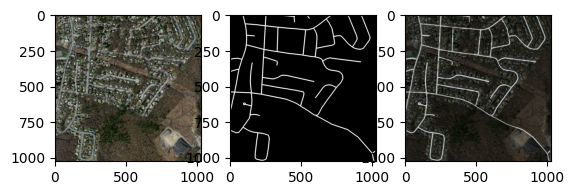

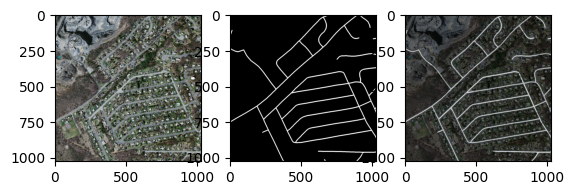

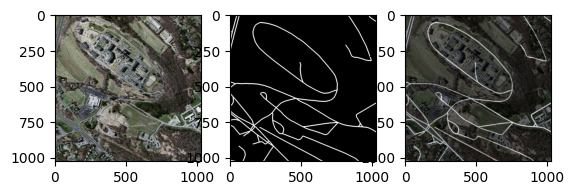

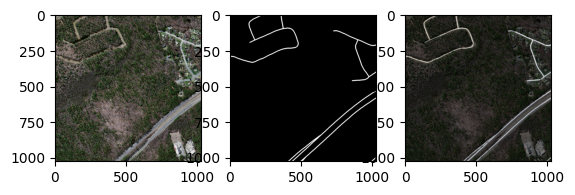

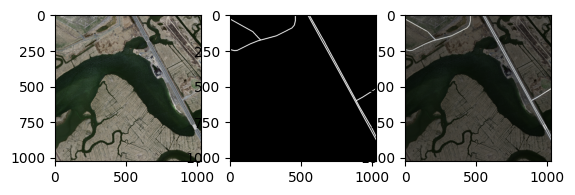

In [12]:
images, masks = next(iter(train_loader))
for i in range(5):
    imshow(images[i], masks[i])

In [13]:
model = smp.Unet(
    encoder_name="resnet34",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=1,
    # model output channels (number of classes in your dataset)
)

In [39]:
class NN(pl.LightningModule):
    def __init__(self, model, learning_rate):
        super().__init__()
        self.model = model
        self.learning_rate = learning_rate
        self.loss_fn = nn.BCEWithLogitsLoss()
        self.sigmoid = nn.Sigmoid()
        self.iou = BinaryJaccardIndex()
        self.dice = Dice()

    def forward(self, x):
        return model(x)

    def training_step(self, batch, batch_idx):
        loss, scores, y = self._common_step(batch, batch_idx)
        scores = (scores > 0.5).to(torch.float32)
        iou = self.iou(scores, y) 
        dice = self.dice(scores, y.to(torch.int32))
        self.log_dict({'train_loss': loss, 'train_iou': iou, 'train_dice': dice},
                      on_step=False, on_epoch=True, prog_bar=True)
        return {'loss': loss, "scores": scores, "y": y}
    
    def validation_step(self, batch, batch_idx):
        loss, scores, y = self._common_step(batch, batch_idx)
        scores = (scores > 0.5).to(torch.float32)
        iou = self.iou(scores, y) 
        dice = self.dice(scores, y.to(torch.int32))
        self.log_dict({'val_loss': loss, 'val_iou': iou, 'val_dice': dice},
                      on_step=False, on_epoch=True, prog_bar=True)
        return {'loss': loss, "scores": scores, "y": y}

    def test_step(self, batch, batch_idx):
        loss, scores, y = self._common_step(batch, batch_idx)
        scores = (scores > 0.5).to(torch.float32)
        iou = self.iou(scores, y) 
        dice = self.dice(scores, y.to(torch.int32))
        self.log_dict({'test_loss': loss, 'test_iou': iou, 'test_dice': dice},
                      on_step=False, on_epoch=True, prog_bar=True)
        return {'loss': loss, "scores": scores, "y": y}

    def _common_step(self, batch, batch_idx):
        x, y = batch
        scores = self.forward(x)
        scores = scores.squeeze(1)
        loss = self.loss_fn(scores, y)
        scores = self.sigmoid(scores)
        return loss, scores, y

    def predict_step(self, batch, batch_idx):
        x, y = batch 
        scores = self.forward(x)

        preds = self.sigmoid(scores)
        return preds

    def configure_optimizers(self):
      optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
      scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, threshold=1e-2)
      return {
          'optimizer': optimizer,
          'lr_scheduler' : {
          # REQUIRED: The scheduler instance
          "scheduler": scheduler,
          # The unit of the scheduler's step size, could also be 'step'.
          # 'epoch' updates the scheduler on epoch end whereas 'step'
          # updates it after a optimizer update.
          "interval": "epoch",
          # How many epochs/steps should pass between calls to
          # `scheduler.step()`. 1 corresponds to updating the learning
          # rate after every epoch/step.
          "frequency": 1,
          # Metric to to monitor for schedulers like `ReduceLROnPlateau`
          "monitor": "val_loss",
          # If set to `True`, will enforce that the value specified 'monitor'
          # is available when the scheduler is updated, thus stopping
          # training if not found. If set to `False`, it will only produce a warning
          "strict": True,
          # If using the `LearningRateMonitor` callback to monitor the
          # learning rate progress, this keyword can be used to specify
          # a custom logged name
          "name": None,
          }
      }
      return optimizer

In [15]:
segmentator = NN(
    model=model,
    learning_rate=1e-3)

In [16]:
from pytorch_lightning.callbacks import ModelCheckpoint
checkpoint_callback = ModelCheckpoint(monitor='val_iou', save_top_k=1, mode='max')

In [17]:
trainer = pl.Trainer(accelerator='gpu', max_epochs=10, precision='16-mixed', callbacks=[checkpoint_callback])

INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [18]:
%reload_ext tensorboard

In [19]:
%tensorboard --logdir '/content/lightning_logs'

Reusing TensorBoard on port 6006 (pid 6425), started 2:41:58 ago. (Use '!kill 6425' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
trainer.fit(segmentator, data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type               | Params
-----------------------------------------------
0 | model   | Unet               | 24.4 M
1 | loss_fn | BCEWithLogitsLoss  | 0     
2 | sigmoid | Sigmoid            | 0     
3 | iou     | BinaryJaccardIndex | 0     
4 | dice    | Dice               | 0     
-----------------------------------------------
24.4 M    Trainable params
0         Non-trainable params
24.4 M    Total params
97.745    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [40]:
seg = NN.load_from_checkpoint(
    '/content/lightning_logs/version_4/checkpoints/epoch=7-step=560.ckpt',
    model=model,
    learning_rate=1e-3)

In [45]:
trainer.test(seg, data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_dice         │    0.7021812200546265     │
│         test_iou          │     0.541271448135376     │
│         test_loss         │    0.07601722329854965    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.07601722329854965,
  'test_iou': 0.541271448135376,
  'test_dice': 0.7021812200546265}]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

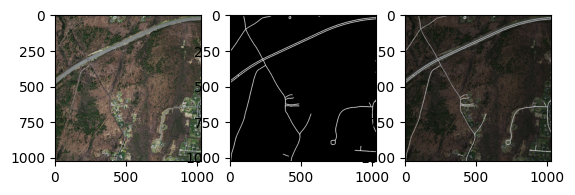

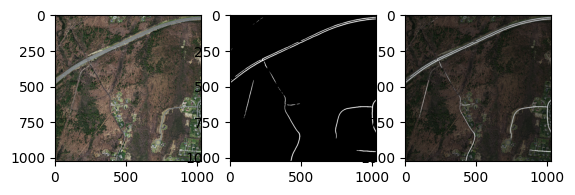

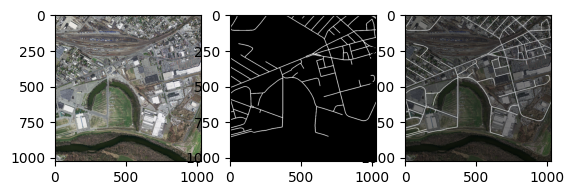

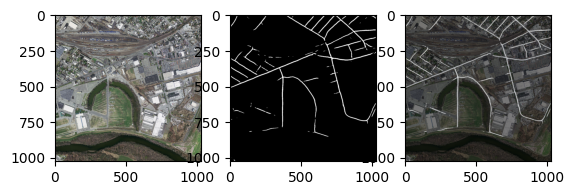

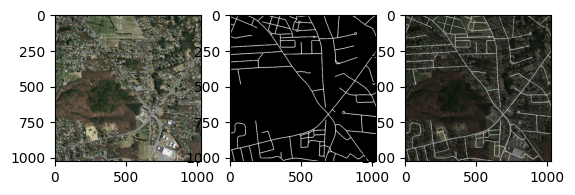

...

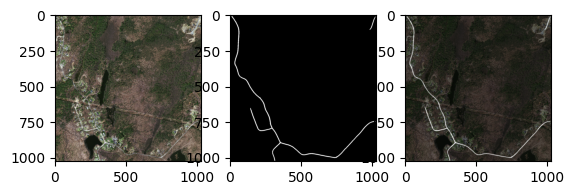

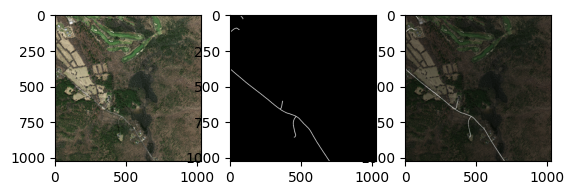

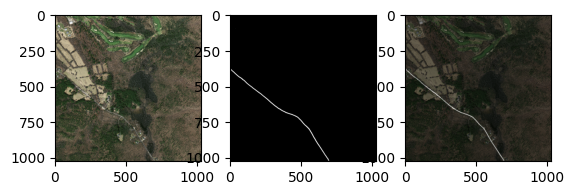

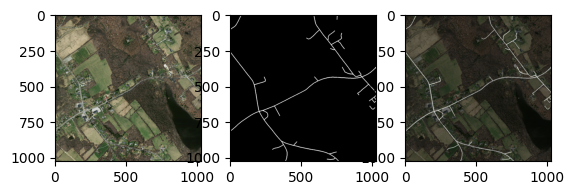

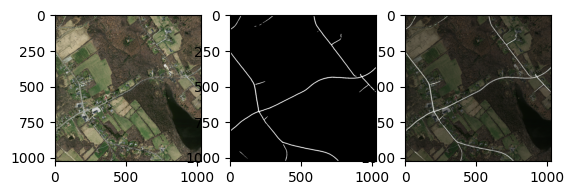

In [46]:
test_loader = data_module.test_dataloader()

images, masks = next(iter(test_loader))
images, masks = images, masks.unsqueeze(1)
preds = trainer.predict(seg, test_loader)
outs = preds[0]
outs = (outs > 0.5).to(torch.float32)
for i in range(10):
    imshow(images[i].detach(), masks[i].detach().squeeze())
    imshow(images[i].detach(), outs[i].detach().squeeze())
